# Travel Reviews Dataset

Data Set Information:

This data set is populated by capturing user ratings from Google reviews. Reviews on attractions from 24 categories across Europe are considered. Google user rating ranges from 1 to 5 and average user rating per category is calculated.

Attribute Information:

Attribute 1 : Unique user id

Attribute 2 : Average ratings on churches

Attribute 3 : Average ratings on resorts

Attribute 4 : Average ratings on beaches

Attribute 5 : Average ratings on parks

Attribute 6 : Average ratings on theatres

Attribute 7 : Average ratings on museums

Attribute 8 : Average ratings on malls

Attribute 9 : Average ratings on zoo

Attribute 10 : Average ratings on restaurants

Attribute 11 : Average ratings on pubs/bars

Attribute 12 : Average ratings on local services

Attribute 13 : Average ratings on burger/pizza shops

Attribute 14 : Average ratings on hotels/other lodgings

Attribute 15 : Average ratings on juice bars

Attribute 16 : Average ratings on art galleries

Attribute 17 : Average ratings on dance clubs

Attribute 18 : Average ratings on swimming pools

Attribute 19 : Average ratings on gyms

Attribute 20 : Average ratings on bakeries

Attribute 21 : Average ratings on beauty & spas

Attribute 22 : Average ratings on cafes

Attribute 23 : Average ratings on view points

Attribute 24 : Average ratings on monuments

Attribute 25 : Average ratings on gardens

# Aim

Aim of the project is to segment users based on their reviews to the given 24 categories and to describe the variation in the different types of users that a travel agency interacts with. My main assumption about data is that Users tend to give ratings according to their tastes. 

Importing libraries

In [1]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

Loading the data.

In [2]:
data = pd.read_csv('E:\Job_app\extra\icx_media/google_review_ratings.csv')

In [3]:
data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


The data has 1 user information column and 24 features. All features are independent and hence will have to use a clustering technique to give labels to the data. After observing the data, it seems python has read an additional unknown column which is dropped in the next cell.

The unknown column is dropped in the next cell.

In [4]:
data.drop('Unnamed: 25', axis=1, inplace=True)

For better understanding, all the column names are changed to their respective attribute names. The attribute names are given in the description of the dataset.

In [5]:
New_cols = ['user_id', 'churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums', 'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services', 'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars', 'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']
data.columns = New_cols

The describe method of pandas is used to get a summary of the data. As described in the description if data, it is observed that all the values are between 1 and 5. There are 5456 users recorded.

In [6]:
data.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5455.000000
mean,1.455720,2.319707,2.489331,2.796886,2.958941,2.89349,3.351395,2.540795,3.126019,2.832729,...,2.206573,1.192801,0.949203,0.822414,0.969811,1.000071,0.965838,1.750537,1.531453,1.560755
std,0.827604,1.421438,1.247815,1.309159,1.339056,1.28240,1.413492,1.111391,1.356802,1.307665,...,1.715961,1.107005,0.973536,0.947911,1.203972,1.193891,0.929853,1.598734,1.316889,1.171756
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.11000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.79000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.905000,2.060000,2.460000,2.670000,2.68000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.682500,2.740000,4.092500,4.312500,3.84000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


# Data Cleaning

Data Cleaning is an important part in any analysis and the next step checks if there are any null values in the data.

In [7]:
data.isnull().sum()

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       1
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  1
dtype: int64

There are 2 null values observed in the data and are being replaced by the means of their respective columns.

In [8]:
data.fillna(data.mean(), inplace=True)

The info method is used to observer the data types of each of the columns in the data. As from the observation, it can be seen that the first data and pubs_bars columns are objects while rest are float types. On further investigation, it is understood that user_id contains user information and hence it is object, while the pubs_bars column is having some issue. The pubs_bars column will have to be converted to a float type.

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
user_id                  5456 non-null object
churches                 5456 non-null float64
resorts                  5456 non-null float64
beaches                  5456 non-null float64
parks                    5456 non-null float64
theatres                 5456 non-null float64
museums                  5456 non-null float64
malls                    5456 non-null float64
zoo                      5456 non-null float64
restaurants              5456 non-null float64
pubs_bars                5456 non-null float64
local_services           5456 non-null object
burger_pizza_shops       5456 non-null float64
hotels_other_lodgings    5456 non-null float64
juice_bars               5456 non-null float64
art_galleries            5456 non-null float64
dance_clubs              5456 non-null float64
swimming_pools           5456 non-null float64
gyms                     5456 non-null float64
ba

The next cell checks if there is an issue in just a few values or all the values of the column. It is observed that all the values except 1 are objects, and hence will have to convert the whole column to float.

In [10]:
data['local_services'] = pd.to_numeric(data['local_services'], errors = 'coerce')

In [11]:
data['local_services'].describe()

count    5455.000000
mean        2.550071
std         1.381769
min         0.780000
25%         1.580000
50%         2.000000
75%         3.220000
max         5.000000
Name: local_services, dtype: float64

It is observed that 1 value in the column was missing and hence is replaced by the mean of the column.

In [12]:
data['local_services'].fillna(data['local_services'].mean(), inplace=True)

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
user_id                  5456 non-null object
churches                 5456 non-null float64
resorts                  5456 non-null float64
beaches                  5456 non-null float64
parks                    5456 non-null float64
theatres                 5456 non-null float64
museums                  5456 non-null float64
malls                    5456 non-null float64
zoo                      5456 non-null float64
restaurants              5456 non-null float64
pubs_bars                5456 non-null float64
local_services           5456 non-null float64
burger_pizza_shops       5456 non-null float64
hotels_other_lodgings    5456 non-null float64
juice_bars               5456 non-null float64
art_galleries            5456 non-null float64
dance_clubs              5456 non-null float64
swimming_pools           5456 non-null float64
gyms                     5456 non-null float64
b

The User information and all the features are being stored in different variables.

In [14]:
data_label = data['user_id']
data_variables = data.drop('user_id', axis=1)

The next cell shows boxplots of all the columns. There seems to be a lot of outliers and treating them by removing does not seem to be a good option as they might have some important information in them.

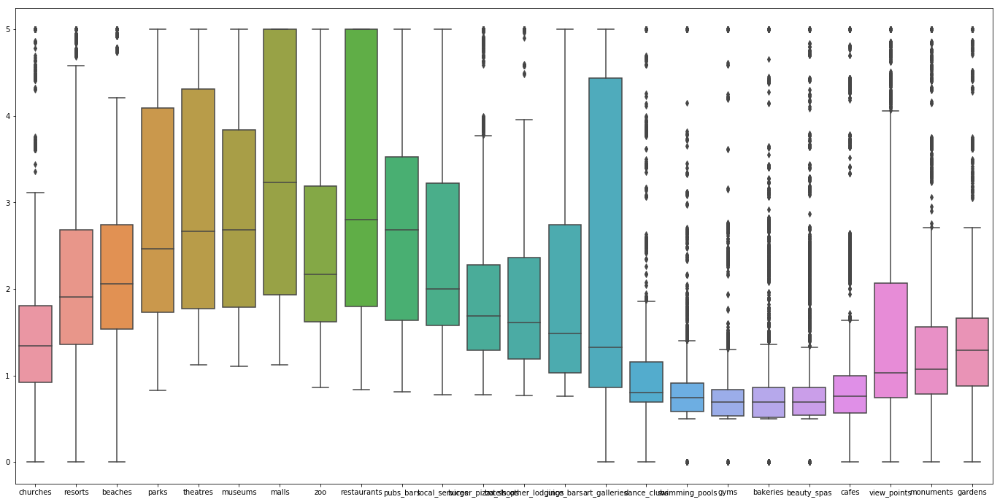

In [15]:
plt.subplots(figsize=(24,12))
sns.boxplot(data=data_variables)

The next cell shows the Scatter Plot of all the columns. It can be seen that features don't seem to be much correlated. Also, none of the columns look to be anywhere near normal distribution. We can try to treat the variables to make them normal, just in case if the clustering algorithms perform bad.

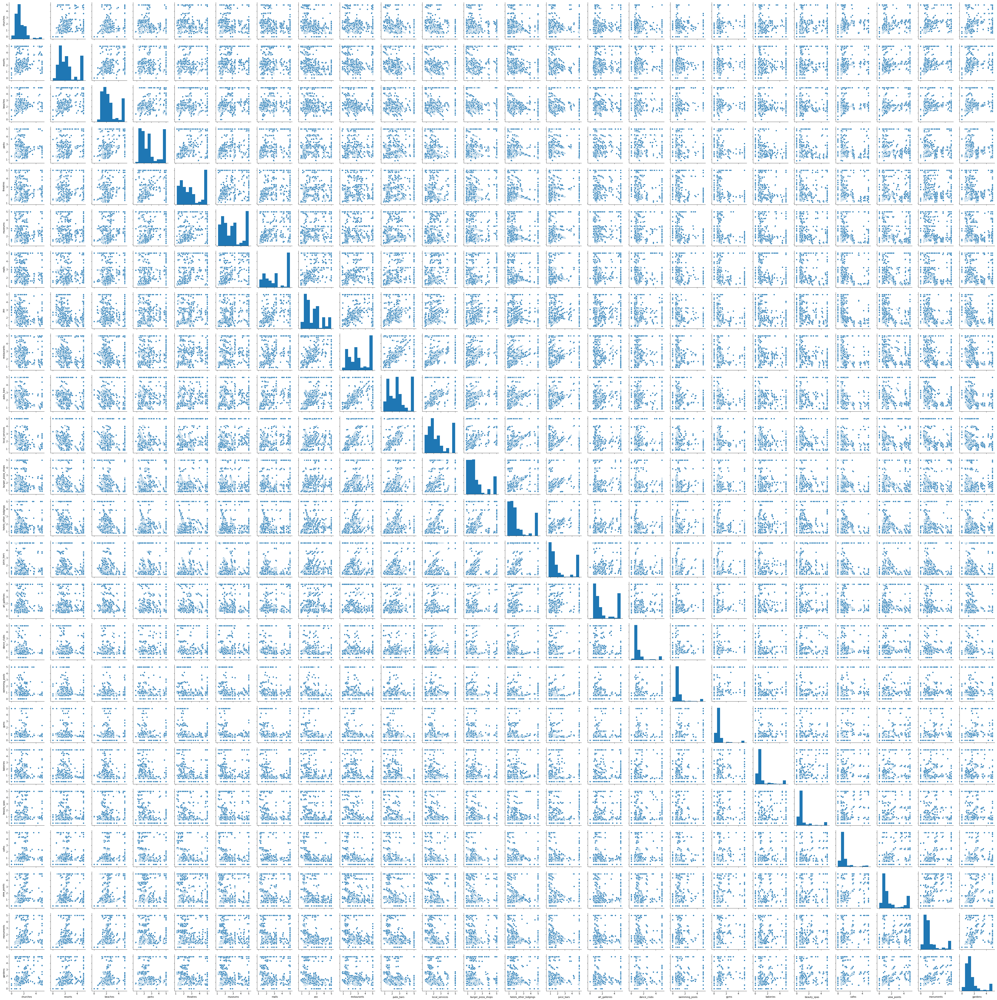

In [16]:
sns.pairplot(data_variables)

The next cell show the correlation between all the variables in depth. It can be seen that there is very less correlation between columns and hence PCA will have a minor effect on the clustering algorithm. Also, even after using all the columns, the algorithm won't be computationally expensive or time consuming. So prefer to use the data as it is.

In [17]:
corr = data_variables.corr()
corr.style.background_gradient(cmap='coolwarm')

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
churches,1,0.248991,0.148805,0.0706921,0.0354512,-0.0931428,-0.264632,-0.181267,-0.290214,-0.274683,-0.214735,-0.261188,-0.178666,-0.236966,-0.134914,0.0672848,0.130099,0.16036,0.180271,0.199397,0.309238,0.364375,0.407033,0.48925
resorts,0.248991,1,0.325011,0.167338,0.15352,0.0539164,-0.0501578,-0.00449964,-0.0505499,-0.0925257,-0.221559,-0.157067,-0.213747,-0.126713,-0.0666701,-0.0331186,-0.0771458,-0.0254465,0.0325288,0.0969741,0.0889904,0.018366,0.0776159,0.125164
beaches,0.148805,0.325011,1,0.396786,0.329925,0.161242,-0.0727131,-0.186308,-0.219842,-0.17909,-0.157542,-0.235693,-0.182322,-0.162605,-0.134203,-0.0222487,-0.0846428,-0.11981,-0.0754019,-0.00920163,0.00110512,0.134571,0.117458,0.0826379
parks,0.0706921,0.167338,0.396786,1,0.626868,0.315354,-0.0679142,-0.128064,-0.169442,-0.115515,-0.117155,-0.166115,-0.145093,-0.308164,-0.27213,0.0182741,-0.132468,-0.183849,-0.192665,-0.0924535,-0.0562259,0.276727,0.17355,0.0905319
theatres,0.0354512,0.15352,0.329925,0.626868,1,0.489937,0.0778075,-0.00259465,-0.17043,-0.100191,-0.124303,-0.104948,-0.0903688,-0.280767,-0.323902,-0.0563473,-0.184345,-0.243357,-0.256987,-0.191997,-0.133433,0.124431,0.128055,0.0988322
museums,-0.0931428,0.0539164,0.161242,0.315354,0.489937,1,0.382774,0.200528,0.114719,-0.0190068,-0.148302,-0.163917,-0.136938,-0.153427,-0.187512,-0.149295,-0.229604,-0.271354,-0.266608,-0.227362,-0.197454,-0.0904814,-0.0811089,-0.066407
malls,-0.264632,-0.0501578,-0.0727131,-0.0679142,0.0778075,0.382774,1,0.406959,0.432054,0.256563,0.0980564,0.0308722,0.0256431,0.0891013,0.0925266,-0.142861,-0.207275,-0.226475,-0.272979,-0.232408,-0.257728,-0.360287,-0.22308,-0.247538
zoo,-0.181267,-0.00449964,-0.186308,-0.128064,-0.00259465,0.200528,0.406959,1,0.53687,0.551409,0.292412,0.00324997,-0.0104132,-0.0218498,-0.0646922,-0.124417,-0.20295,-0.236106,-0.281018,-0.254393,-0.274733,-0.25552,-0.167927,-0.137287
restaurants,-0.290214,-0.0505499,-0.219842,-0.169442,-0.17043,0.114719,0.432054,0.53687,1,0.564086,0.262025,-0.0125884,0.0193248,0.0322601,0.12672,-0.119844,-0.229585,-0.2667,-0.271881,-0.164033,-0.185958,-0.268053,-0.268314,-0.326546
pubs_bars,-0.274683,-0.0925257,-0.17909,-0.115515,-0.100191,-0.0190068,0.256563,0.551409,0.564086,1,0.469469,0.128393,0.0662218,-0.0018028,0.0380844,-0.0319267,-0.212346,-0.273837,-0.324115,-0.247502,-0.230389,-0.18366,-0.21303,-0.263439


The next step tried is to reduce the dimensions of data, i.e., the columns of the data. This step is performed to reduce data to 2 dimensions so as to use it for visualization.

The data is being standardized. Standardized data means data having 0 mean and 1 standard deviation. The df_new contains all the standardized data.

In [18]:
from sklearn.preprocessing import StandardScaler

In [19]:
scalar = StandardScaler()

df_new = scalar.fit_transform(data_variables)
df_new = pd.DataFrame(df_new)
df_new.index = data_variables.index
df_new.columns = data_variables.columns

The next step is to apply PCA. Assuming that the variance of data in not needed, the data is reduced to 2 dimensions, so that we can visualize the clusters.

In [20]:
pca = PCA(n_components=2).fit(df_new)

reduced_data = pca.transform(df_new)

reduced_data = pd.DataFrame(reduced_data, columns = ['dimension_1', 'dimension_2'])

The next step is to try a clustering algorithm on the data. Since the data has a lot of noise, DBSCAN is the algorithm with which we can try first.

In [21]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=2, min_samples = 2)
clusters = dbscan.fit_predict(df_new)
labels = dbscan.labels_

The next figure shows a 2-D reduced plot of the data and the clusters being represented in colours. 

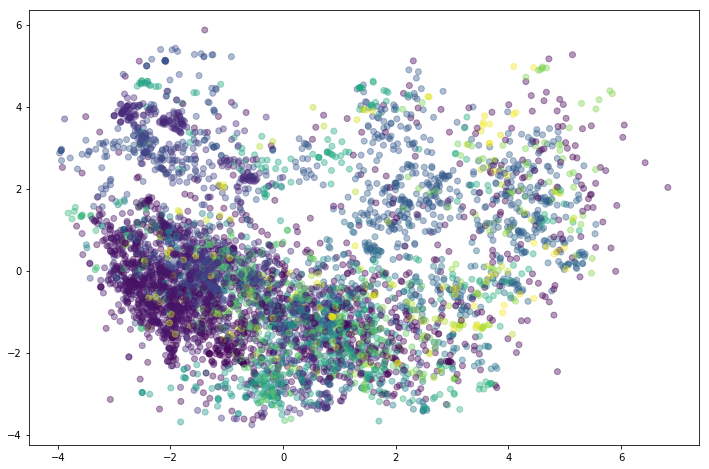

In [22]:
plt.subplots(figsize=(12,8))
plt.scatter(data=reduced_data,x='dimension_1', y='dimension_2', c =labels, alpha=0.4)

Different values ranging from 0.01 to 2 were tried for eps variable in DBSCAN algorithm, but it is observed that DBSCAN was not able to perform well might be because of the shape of data. It was not able to pick clusters at all and hence we will have to try some other algorithms.

The next algorithm tried is the K-Means algorithm. Although this algorithm is not the best to deal with noisy data, but it is one of the best clustering algorithm to try out and very easy to implement and understand. Another main reason is that, the data seems to be spherical, for which the K-means performs good as compared to other shapes of data.

In [23]:
def find_kmeans(data_, start=2, end=10):
    
    n_cl = []
    inertia = []
    
    for n_cluster in range(start, end):
        kmeans = KMeans(n_clusters=n_cluster)
        labels = kmeans.fit(data_)
        
        iner = kmeans.inertia_
        inertia.append(iner)
        n_cl.append(n_cluster)
        
        if n_cluster == start:
            print("No. of Clusters: {}, Inertia: {}, Change in Inertia: {}".format(n_cluster,iner,0.0))
        else:
            print("No. of Clusters: {}, Inertia: {}, Change in Inertia: {}".format(n_cluster,iner, round(inertia[n_cluster - start] - inertia[n_cluster - start - 1],3)))
        
        if n_cluster == end - 1:
            plt.figure(figsize=(12,8))
            plt.title("Scree Plot")
            sns.pointplot(x=n_cl,y=inertia)

No. of Clusters: 2, Inertia: 112269.2115562275, Change in Inertia: 0.0
No. of Clusters: 3, Inertia: 99756.84234312626, Change in Inertia: -12512.369
No. of Clusters: 4, Inertia: 92077.17451799253, Change in Inertia: -7679.668
No. of Clusters: 5, Inertia: 87494.15447454984, Change in Inertia: -4583.02
No. of Clusters: 6, Inertia: 83110.44737732234, Change in Inertia: -4383.707
No. of Clusters: 7, Inertia: 79725.64684121183, Change in Inertia: -3384.801
No. of Clusters: 8, Inertia: 76936.52080562308, Change in Inertia: -2789.126
No. of Clusters: 9, Inertia: 74354.35778335163, Change in Inertia: -2582.163
None


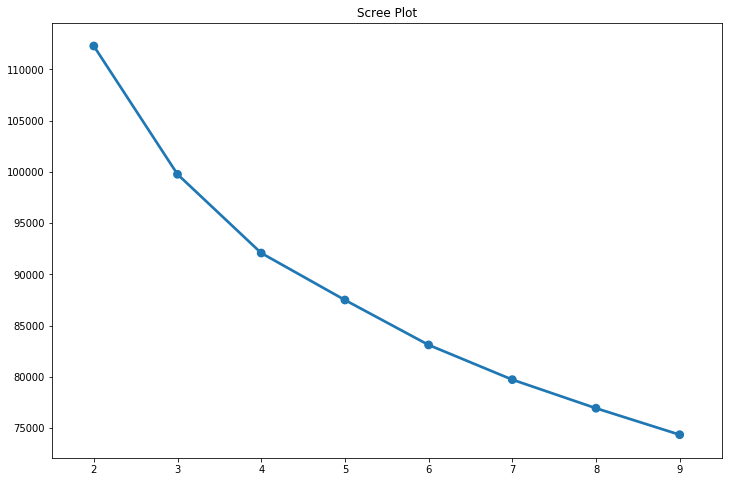

In [24]:
print(find_kmeans(data_= df_new))

By using a scree plot, we can see that after the number 4, the error loss reduces. So, we can choose k = 4 and try to visualize to see if we our getting good results.

In [25]:
kmeans = KMeans(n_clusters = 4, random_state = 101)
kmeans.fit(df_new)
cluster_labels = kmeans.labels_

Text(0.5, 1.0, 'Visualization of clustered data')

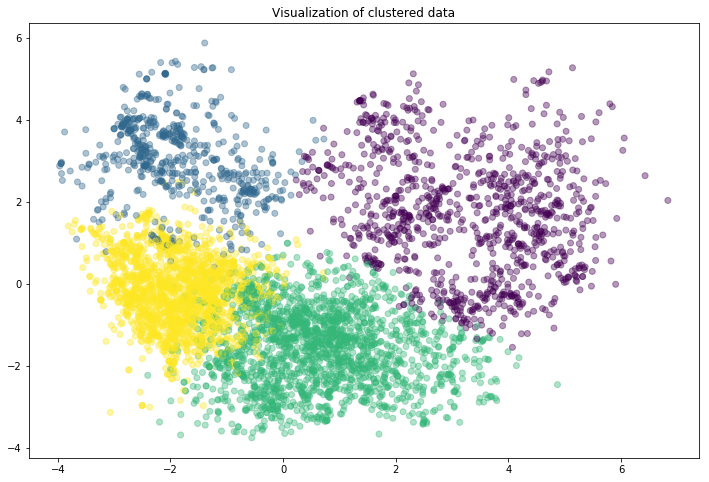

In [26]:
plt.subplots(figsize=(12,8))
plt.scatter(data=reduced_data,x='dimension_1', y='dimension_2', c =cluster_labels, alpha=0.4)

plt.title('Visualization of clustered data')

As we can see, many data points were already in clusters, and the K-Means data was able to predict the groups better. 

The labels for groups is stored and updated to the main dataframe for further analysis

In [27]:
data['label'] = cluster_labels

In [28]:
data.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.455720,2.319707,2.489331,2.796886,2.958941,2.89349,3.351395,2.540795,3.126019,2.832729,...,1.192801,0.949203,0.822414,0.969811,1.000071,0.965838,1.750537,1.531453,1.560755,1.855755
std,0.827604,1.421438,1.247815,1.309159,1.339056,1.28240,1.413492,1.111391,1.356802,1.307665,...,1.107005,0.973536,0.947911,1.203972,1.193891,0.929853,1.598734,1.316889,1.171649,1.081761
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.11000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.79000,1.930000,1.620000,1.800000,1.640000,...,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000,1.000000
50%,1.340000,1.905000,2.060000,2.460000,2.670000,2.68000,3.230000,2.170000,2.800000,2.680000,...,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000,2.000000
75%,1.810000,2.682500,2.740000,4.092500,4.312500,3.84000,5.000000,3.190000,5.000000,3.530000,...,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000,3.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000


In [29]:
data.head()

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2


In [30]:
pd.set_option('display.max_columns', 30)
data[data['label'] == 0].sample(5)

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
867,User 868,3.64,5.00,5.00,2.66,2.67,2.22,1.90,1.36,1.35,1.34,1.35,1.37,1.19,1.63,0.77,0.76,0.77,0.79,0.87,0.87,0.79,0.78,0.79,4.85,0
769,User 770,1.78,1.80,1.82,3.21,2.01,1.98,2.01,2.00,2.06,2.20,1.93,1.91,2.02,1.94,1.97,1.44,1.42,1.42,1.90,5.00,0.59,0.89,1.78,1.77,0
4387,User 4388,1.47,1.65,2.46,1.89,1.88,1.88,1.91,1.92,2.49,2.28,2.26,2.26,2.28,2.81,5.00,5.00,5.00,0.00,0.00,0.61,1.48,1.46,1.45,1.45,0
2673,User 2674,2.19,5.00,2.16,2.14,2.15,2.15,2.14,1.42,1.41,1.40,1.47,1.70,1.96,1.97,1.30,1.27,1.27,1.29,5.00,2.34,1.34,2.27,2.28,3.29,0
4496,User 4497,2.60,2.57,2.46,1.35,1.63,1.29,1.28,1.29,1.45,1.56,1.58,0.79,0.78,0.80,5.00,0.91,0.93,0.94,0.84,0.85,4.43,3.68,3.73,2.66,0


The Users having label 0 seems to be more interested in churches, beaches, resorts, gardens, view points and parks as compared to other categories. This can be a family or senior citizens.

In [31]:
pd.set_option('display.max_columns', 30)
data[data['label'] == 1].sample(5)

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
4330,User 4331,0.71,0.74,1.61,1.58,1.58,1.58,1.60,1.62,2.53,3.04,3.03,5.0,5.0,5.0,5.00,0.69,0.68,0.68,0.71,1.07,0.70,0.68,0.68,0.68,1
2506,User 2507,0.00,0.00,1.45,1.42,1.41,1.42,1.59,1.46,2.67,2.68,3.28,5.0,5.0,5.0,5.00,0.84,0.83,0.83,0.87,1.03,0.51,0.00,0.00,0.00,1
3480,User 3481,0.55,0.59,1.56,1.45,1.45,1.45,1.49,1.50,2.59,3.19,3.19,5.0,5.0,5.0,5.00,0.81,0.80,0.81,0.83,0.59,0.55,0.53,0.52,0.53,1
3481,User 3482,0.57,0.60,1.49,1.46,1.45,1.46,1.50,1.50,2.58,3.18,3.16,5.0,5.0,5.0,5.00,0.80,0.79,0.80,0.83,1.07,0.57,0.55,0.54,0.55,1
5244,User 5245,0.81,0.84,1.63,1.61,1.60,1.61,5.00,1.65,2.45,3.03,2.93,5.0,5.0,5.0,0.82,0.68,0.66,0.66,0.68,0.71,0.81,0.79,0.78,0.79,1


The Users having label 1 seems to be more interested in restaurants, pubs and bars, burger pizza shops and juice bars as compared to other categories. So, might be they are group of youngsters or young couples.

In [32]:
pd.set_option('display.max_columns', 30)
data[data['label'] == 2].sample(5)

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
4818,User 4819,2.10,2.33,2.44,5.00,5.00,3.24,3.24,2.92,3.60,3.22,3.98,1.11,1.10,1.08,0.62,0.98,0.94,0.97,0.80,0.77,4.21,4.22,5.00,1.60,2
4800,User 4801,2.05,2.04,2.05,2.98,2.98,2.09,3.24,3.04,4.23,3.43,5.00,1.57,5.00,0.90,1.15,1.07,1.07,0.71,0.68,0.68,0.69,2.98,5.00,1.57,2
4087,User 4088,1.15,5.00,5.00,3.30,4.27,5.00,5.00,1.88,2.55,2.55,1.69,1.67,1.66,1.67,1.70,0.71,1.84,0.00,0.00,0.00,0.64,1.13,1.12,1.13,2
5145,User 5146,1.31,1.34,2.48,2.49,3.13,3.18,5.00,1.05,5.00,1.00,0.99,1.00,1.24,1.23,0.76,0.57,0.55,0.56,0.58,0.60,1.29,1.28,1.27,1.28,2
284,User 285,2.43,2.36,5.00,1.94,2.01,3.20,4.20,2.88,2.90,2.02,3.95,1.22,5.00,1.04,0.59,0.96,0.95,0.97,0.80,0.80,0.81,5.00,5.00,1.91,2


The Users having label 2 seems to be more interested in beaches, resorts, parks, theatres, museums, restaurants and zoo as compared to other categories. So, might be more of families with small childrens.

In [33]:
pd.set_option('display.max_columns', 30)
data[data['label'] == 3].sample(5)

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,label
2395,User 2396,0.81,5.00,1.55,2.12,2.94,5.00,5.0,1.54,5.00,1.47,1.46,1.47,1.49,1.71,1.74,0.72,0.71,0.71,0.73,0.76,0.82,0.80,0.79,0.82,3
2017,User 2018,1.44,1.46,1.66,1.96,5.00,1.78,3.2,5.00,3.83,5.00,5.00,1.53,1.48,1.46,1.46,0.79,0.63,0.00,0.00,0.00,0.52,1.63,1.17,1.45,3
413,User 414,0.85,5.00,5.00,2.95,5.00,2.15,5.0,3.34,5.00,4.40,5.00,2.09,2.11,2.12,3.34,0.60,0.58,0.57,0.58,1.73,0.80,0.79,0.80,0.82,3
406,User 407,1.50,5.00,5.00,5.00,4.00,2.14,5.0,5.00,3.43,4.39,5.00,2.23,2.24,2.42,3.43,5.00,0.64,0.60,0.61,0.64,0.68,0.68,0.69,0.71,3
2398,User 2399,0.87,0.91,1.60,2.15,2.85,5.00,5.0,5.00,5.00,1.43,1.41,1.41,1.44,1.66,5.00,0.70,0.69,0.71,0.71,1.19,0.87,0.85,0.83,0.87,3


The Users having label 3 seems to be more interested in theatres, museums, malls, restaurants and zoo as compared to other categories. So, might be high school kids or teenagers.

So, according to my assumption, Users tend to give more ratings to what they prefer and hence, different type of Users can be segmented according to what they prefer. Also, this kind of analysis can be usefull to predict into what category a new user will fall. Accordingly, companies can target Users and offer them trips according to their tastes. 

In the next part, we will build a predictive model to help us further analyze new Users.

Diving the data into training and testing data. Used 80% of data for training and remaining for testing.

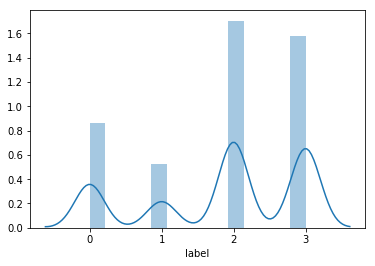

In [34]:
sns.distplot(data['label'])

In [35]:
X_train, X_test, y_train, y_test = train_test_split(data_variables, data['label'], test_size=0.2, random_state=42)

Since, our data has many outliers, Regression techniques won't fit. One of the best algorithms to perform better on outliers or noisy data are the tree based algorithsm.

In [36]:
clf = RandomForestClassifier()
extra = ExtraTreesClassifier()

clf.fit(X_train, y_train)
extra.fit(X_train, y_train)

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [37]:
preds = clf.predict(X_test)
preds_extra = extra.predict(X_test)

Since, the categories seem to be balanced and hence accuracy can be a good metric to judge the performance of algorithms.

In [38]:
print("Accuracy of Random Forest Classifier:",accuracy_score(y_test, preds))
print("Accuracy of Extra Trees Classifier:",accuracy_score(y_test, preds_extra))

Accuracy of Random Forest Classifier: 0.9560439560439561
Accuracy of Extra Trees Classifier: 0.9551282051282052


From this, we see that Extra Tree Classifiers did a better job at predicting labels and hence we can use that model to deploy in production for business use.

The next figure shows the pipeline which can be used to rebuild model and put into production.

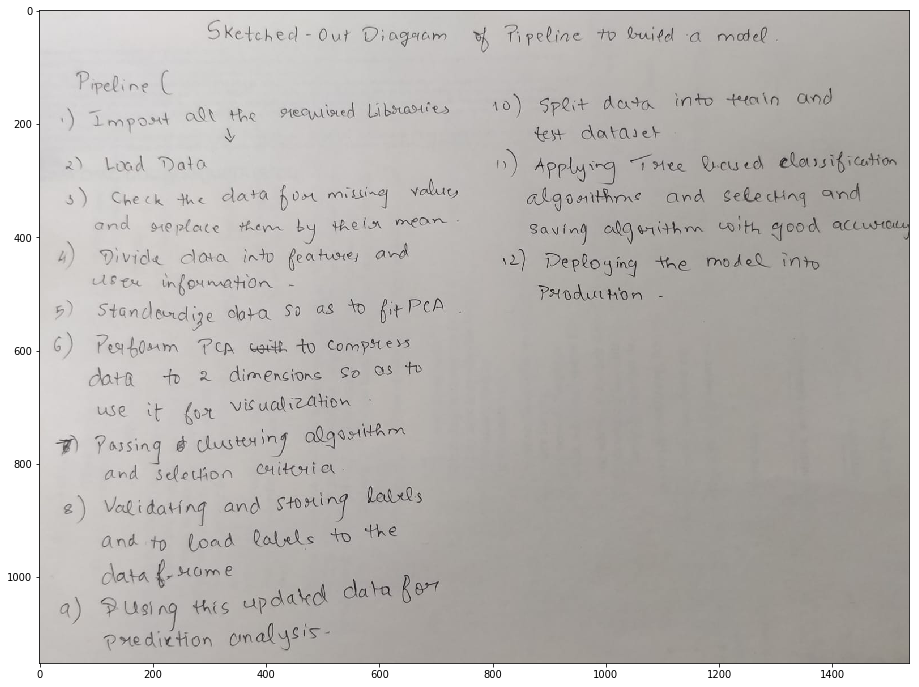

In [39]:
plt.subplots(figsize=(18,12))
img = mpimg.imread('E:\Job_app\extra\icx_media/pipeline.jpeg') 
plt.imshow(img) 

# Thank you